# Motivation

The central goal of generative modeling is to learn the underlying probability distribution $p(x)$ of some data we observe.
Once we have such a model, we can use it to generate new samples $x \sim p(x)$ from the learned distribution which resemble the real data. 
The problem is that the true data distribution is unknown and we only have access to a finite set of samples drawn from it (our dataset).
Furthermore, real-world data (such as images, audio, or text) is highly complex, so we need a similarly complex model.

Early neural generative models, such as energy-based models (EBMs) explored in the 2000s, addressed this by not imposing strong restrictions on the form of the model distribution:
$$
p_\theta(x) = \frac{\exp(-E_\theta(x))}{Z_\theta},
$$
where $E_\theta(x)$ is an energy function learned from data, and $Z_\theta$ is the normalization constant ensuring that the result is a valid probability distribution.
The main challenge is that computing 
$$
Z_\theta = \int \exp(-E_\theta(x)) \, dx
$$
requires integration over the entire input space, which grows exponentially with dimensionality.
Moreover, strong dependencies between features prevent the joint distribution from factorizing into independent components, making this integral completely intractable.
As a result, training EBMs typically relies on expensive approximations such as Markov Chain Monte Carlo (MCMC), which are often required to estimate gradients during training and significantly limit scalability.

This intractability of the normalization constant became a major obstacle for energy-based generative models, motivating the search for alternative approaches. Among these, diffusion models have emerged as a particularly powerful solution.

# Diffusion Models

Diffusion models were first introduced by Sohl-Dickstein et al. (2015), but initially received limited attention. 
This changed significantly with the influential work of Ho et al. (2020), who demonstrated state-of-the-art image generation performance and brought diffusion models to the forefront of generative modeling research.

Diffusion models are inspired by concepts from non-equilibrium thermodynamics. They define a Forward Process that gradually destroys structure in the data through a sequence of tractable stochastic transformations.
The corresponding generative model then learns to undo this in the Reverse Process, reconstructing clean data samples from their noisy counterparts.

This approach reframes the difficult task of modeling a complex high-dimensional data distribution into a series of simpler denoising problems. 
By learning to iteratively recover less noisy versions of the data, the model ultimately learns to generate samples from the target distribution.

## Forward Process:

The forward process is modeled as a Markov chain of Gaussians:
$$
    q(\boldsymbol{x}_{1:T} \mid \boldsymbol{x}_0) := \prod_{t=1}^{T} q(\boldsymbol{x}_t \mid \boldsymbol{x}_{t-1}), \quad
    q(\boldsymbol{x}_t \mid \boldsymbol{x}_{t-1}) := \mathcal{N}(\boldsymbol{x}_t; \sqrt{1 - \beta_t} \, \boldsymbol{x}_{t-1}, \beta_t \boldsymbol{I}).
$$

In this part we will try to intuitively understand this Forward Process. We do this by applying it to points forming a 2d-spiral instead of images directly. This will help us see the interesting connection to physics.

In [116]:
# Set interactive_animation=True if you run the notebook yourself
# This enables interactive animations directly in the notebook
interactive_animation=False

In [117]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import display, Image, HTML

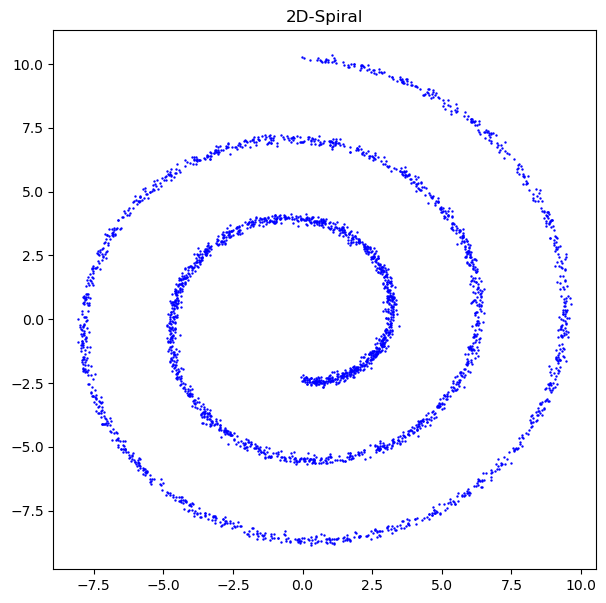

In [118]:
# Spiral data
n_samples = 3000
theta = np.pi * (1.5 + 5 * np.random.rand(n_samples))
r = 0.5 * theta
x = r * np.cos(theta) + 0.1 * np.random.randn(n_samples)
y = r * np.sin(theta) + 0.1 * np.random.randn(n_samples)
data = np.hstack((x[:, np.newaxis], y[:, np.newaxis]))

plt.figure(figsize=(7,7))
plt.scatter(x,y, s=0.5, c='blue')
plt.title("2D-Spiral")
plt.show()

If we try to connect this plot to images we can think of each point as one image. Each point could represent for example a different image of a car. The whole spiral then forms the subspace of all possible car-images. The point distribution of the spiral is therefore what the model needs to learn to generate new points (or in our analogy new images of cars). Now that we understand the connection images, let's solely focus on the points to try to get insight from this simplified example.

The Forward Process in Diffusion models is gradually destroying the structure in the data. This is not done arbitrarily but following - as the name suggest - the physical principle of diffusion which is the one governing why a drop of dye mixes with the water even without stirring (Brownian Motion). But how exactly is the principle used in Diffusion models? 
To understand this, let's create an animation of the Forward Process. We can think of each of the dots in the animation as a blue-dye particle in a glass of water.

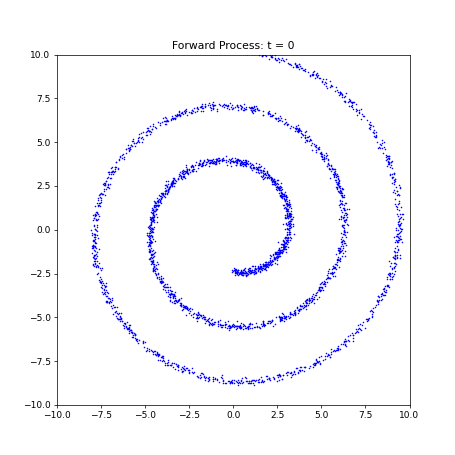

In [142]:
# Takes around 40s to execute

# Parameters
T = 300
betas = np.linspace(0.0002, 0.02, T) 

def forward_step(x_prev, t, noise):
    return np.sqrt(1 - betas[t]) * x_prev + np.sqrt(betas[t]) * noise

# Code for the animation (irrelevant for understanding concepts)
fig, ax = plt.subplots(figsize=(7, 7))
scat = ax.scatter([], [], s=0.5, c='blue')
ax.set_xlim(-10, 10)
ax.set_ylim(-10, 10)
xt = data.copy()
def update(frame):
    global xt
    noise = np.random.randn(*xt.shape)
    xt = forward_step(xt, frame, noise)
    scat.set_offsets(xt)
    ax.set_title(f"Forward Process: t = {frame}")
    return scat,
ani = animation.FuncAnimation(fig, update, frames=T, interval=30, blit=True, repeat=False)
plt.close()

if interactive_animation:
    display(HTML(ani.to_jshtml()))
else:
    ani.save('spiral_forward.gif', writer='pillow', fps=10, dpi=65)
    display(Image(filename="spiral_forward.gif", width=700, height=700) )

If we look at the dynamics of the Forward Process we notice two mechanisms at play. The particles seem to spread out randomly, which is especially noticable in the beginning where the fine spiral shape is being destroyed. Furthermore the points seem to be pulled to the middle, especially till the end which results in them clumping together. Indeed the speed at which these two structure-destroying mechanisms occur is constructed through the parameter $\beta$ which changes over time. This change of $\beta$ is therefore also called the noise-schedule. In the code above we used the standard linear schedule which goes from low noise($\beta_0=0.0002$) to high noise ($\beta_T=0.02$) with equal step size.

This whole forward process can be very cleanly formalized by math describing physical diffusion, so called stochastic differential equations (SDEs), which are of the following form:
$$
    dx_t = \mu(x,t) \, dt +  \sigma(x,t) \, dW_t, \qquad dW_t \sim \mathcal{N}(0, dt).
$$

On the left side is the deterministic drift term, which is the same as in standard differential equations . The drift coefficient 
$\mu(x,t)$ can be seen as a vector field which gives us the force acting on the particles.
The randomness is included through the diffusion term on the right. The Wiener increment $dW_t$ makes it possible to include stochasticity into the differential equation, while the diffusion coefficient $\sigma(x_t,t)$ decides over how large the stochastic motion is. 

 SDEs therefore describes two physical principles: A deterministic force field $\mu(x,t) = -\nabla \Phi(x,t)$ acting on the particles  and random 'kicks' arising for example from collisions with the other particles in a fluid.
 Let's now check how the coefficients look for our Forward Process in order to make an intuitive physical analogy.

For our Forward Process in Diffusion Models the SDE takes on the following form:

$$
    dx = -\frac{1}{2} \beta_t x \, dt + \sqrt{\beta_t} \, dW_t.
$$

Comparing this to the general SDE above, we can identify both drift and diffusion coefficient. Both depend on $t$ through $\beta_t$ and since we used a linear increasing noise schedule this means both coefficients increase over time. For the diffusion terms this could come from heating up the water in the glass over time. 
Since our drift coefficient depends linearly on $x$, we can identify the potential as harmonic coming from for example an electric field.

We now found a very elegant physicsal analogy to the dynamics of the Foward Process in Diffusion Models:
We can think of it as what happens to dye particles in water. Initially they form some pattern in the water like a spiral. They are then subject to random hits from the water particles with increasing strength through heating up the water. Furthermore, they are subject to an increasing harmonic field (e.g. an electric field). This leads to their distribution being destroyed more and more as time progresses and approaching standard Gaussian noise.

### Forward Diffusion on a real image
Now that we have this physical analogy, let's look at the Forward Processes for a real picture. Remember that this is not analagous to the whole spiral becoming Gaussian noise, but to one point of it.

In [146]:
import requests
import PIL
from io import BytesIO

response = requests.get('https://upload.wikimedia.org/wikipedia/commons/1/1b/2008_Daihatsu_Mira-Custom_01.jpg', headers={'User-Agent':'Mozilla'})
img = PIL.Image.open(BytesIO(response.content)).resize((90,60))
img_arr = np.array(img)/255

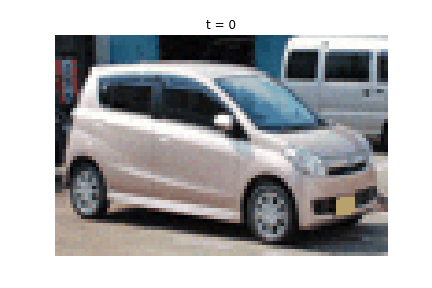

In [154]:
# takes around 10s to execute

# Parameters (Smaller T, but increased noise-schedule to decrease size of the animation)
T = 100
betas = np.linspace(0.0002, 0.04, T) 

def forward_step(x_prev, t, noise):
    return np.sqrt(1 - betas[t]) * x_prev + np.sqrt(betas[t]) * noise


# Creating the Animation
xt = img_arr.copy()
fig, ax = plt.subplots(figsize=(6,4))
ax.axis('off')
img_plot = ax.imshow(xt)

def update(frame):
    global xt
    noise = np.random.randn(*xt.shape)

    xt = xt*2-1
    xt = forward_step(xt, frame, noise)
    xt = (xt+1)/2
    xt = np.clip(xt,0,1)
    ax.set_title(f"t = {frame}")
    img_plot.set_data(xt)
    return img_plot,

ani = animation.FuncAnimation(fig, update, frames=T, interval=100, blit=True, repeat=False)
plt.close()

if interactive_animation:
    display(HTML(ani.to_jshtml()))
else:
    ani.save('image_forward.gif', writer='pillow', fps=8, dpi=72)
    display(Image(filename="image_forward.gif", width=700, height=500))

A key property of this formulation is that it allows direct sampling at arbitrary time steps, since the composition of Gaussian transitions remains Gaussian:
$$
    q(\boldsymbol{x}_t \mid \boldsymbol{x}_0) = \mathcal{N}(\boldsymbol{x}_t; \sqrt{\bar{\alpha}_t} \, \boldsymbol{x}_0, (1 - \bar{\alpha}_t) \boldsymbol{I}), \qquad \alpha_t := 1 - \beta_t, \quad \bar{\alpha}_t := \prod_{s=1}^{t} \alpha_s. 
$$
This makes it possible to go to any timestep $t$ directly which speeds up computation significantly.

Formalizing the Forward Process as the realization of a SDE has given us a very nice physical interpretation. More importantly, this framework also enables us to invoke a result from statistical physics: under mild regularity conditions, there exists a time-reversed diffusion process of the same functional form (originally based on work by Kolmogorov in 1931 and formalized in subsequent literature). This forms the theoretical basis for defining the generative (reverse) process.

## Reverse Process

The reverse process is designed to undo the noising procedure of the forward process, gradually reconstructing the structure of the original data.
Motivated by the existence of a time-reversed SDE for the forward diffusion, we model the reverse dynamics as a Markov chain of Gaussians:
$$
    p_\theta(\boldsymbol{x}_{0:T}) := p(\boldsymbol{x}_T) \prod_{t=1}^{T} p_\theta(\boldsymbol{x}_{t-1} \mid \boldsymbol{x}_t),
    \qquad
    p(\boldsymbol{x}_T) = \mathcal{N}(\boldsymbol{x}_T; \boldsymbol{0}, \boldsymbol{I}).
$$
Here, the model is trained to approximate the true reverse conditionals $q(\boldsymbol{x}_{t-1} \mid \boldsymbol{x}_t)$ with parameterized Gaussian distributions:
$$
    p_\theta(\boldsymbol{x}_{t-1} \mid \boldsymbol{x}_t) := \mathcal{N}(\boldsymbol{x}_{t-1}; \boldsymbol{\mu}_\theta(\boldsymbol{x}_t, t), \boldsymbol{\Sigma}_\theta(\boldsymbol{x}_t, t)).
$$
The learnable parameters are the mean $ \boldsymbol{\mu}_\theta(\boldsymbol{x}_t, t) $ and covariance $ \boldsymbol{\Sigma}_\theta(\boldsymbol{x}_t, t) $, both predicted by a neural network conditioned on the current noisy sample $ \boldsymbol{x}_t $ and the time step $ t $.

## Training Objective

To train the model, we minimize the negative log-likelihood of the data $ \mathcal{D} $, which corresponds to maximizing the probability that our generative model produces samples similar to the training data:
$$
\mathcal{L} = - \sum_{\boldsymbol{x}_0 \in \mathcal{D}} \log p_\theta(\boldsymbol{x}_0)
$$

Through a lot of quite complex math which I decided to leave out here, it can be shown that the loss can be formulate as the following:
$$
\mathbb{E}_{\boldsymbol{x}_0,\,t,\,\boldsymbol{\epsilon}} \left[
\left\| \boldsymbol{\epsilon}
- \boldsymbol{\epsilon}_\theta\left(\boldsymbol{x}_t,\,t
\right) \right\|^2
\right]
$$
(I included the full derivation in the Appendix for the curious of you)

This loss formulation shows that we can train our model by predicting the noise which was added in the Forward Process. This interesting loss formulation is indeed the main contribution of the breakthrough paper in 2020 which lead to the surge of interest in Diffusion Models.

We will now implement the training procedure on our toy data to generate new spiral points:

In [123]:
import torch
import torch.nn as nn

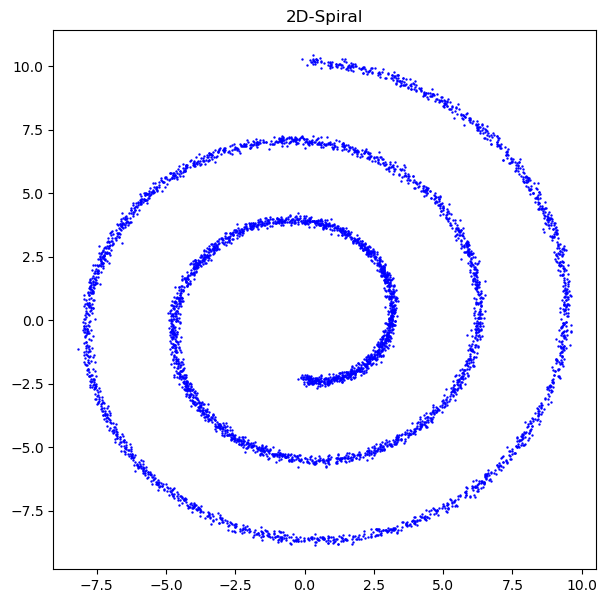

In [124]:
# Spiral data
n = 5000
theta = torch.pi * (1.5 + 5 * torch.rand(n))
r = 0.5 * theta
x = r * torch.cos(theta) + 0.1 * torch.randn(n)
y = r * torch.sin(theta) + 0.1 * torch.randn(n)
data_tensor = torch.vstack((x,y)).T

plt.figure(figsize=(7,7))
plt.scatter(data_tensor[:,0], data_tensor[:,1], s=0.5, c='blue')
plt.title("2D-Spiral")
plt.show()

In [125]:
# Create Linear Noise Schedule
T = 300
betas = torch.linspace(0.0002, 0.02, T)
alphas = 1 - betas
alpha_bars = torch.cumprod(alphas, dim=0)

# Explicit sampling of any timestep t
def noising(x0, t, noise):
    sqrt_alpha_bars_t = torch.sqrt(alpha_bars[t]).reshape(-1, 1)
    sqrt_one_minus_alpha_bars_t = torch.sqrt(1 - alpha_bars[t]).reshape(-1, 1)
    
    xt = sqrt_alpha_bars_t * x0 + sqrt_one_minus_alpha_bars_t * noise
    
    return xt

In [126]:
# Our Model. The Backbone of the Generative Process which will learn to unnoise our data.
class DenoisingMLP(nn.Module):
    def __init__(self, in_features=2, time_embedding_dim=64):
        super(DenoisingMLP, self).__init__()

        self.time_embedding = nn.Sequential(
            nn.Linear(1, time_embedding_dim),
            nn.GELU(),
            nn.Linear(time_embedding_dim, time_embedding_dim),
            nn.GELU()
        )

        self.net = nn.Sequential(
            nn.Linear(in_features + time_embedding_dim, 256),
            nn.GELU(),
            nn.Linear(256, 256),
            nn.GELU(),
            nn.Linear(256, 2) 
        )

    def forward(self, x, t):

        t_embedded = self.time_embedding(t.float().unsqueeze(1) / T)
        x_and_t = torch.cat([x, t_embedded], dim=1)
        
        return self.net(x_and_t)


In [127]:
model = DenoisingMLP()
optimizer = torch.optim.Adam(model.parameters(),lr=0.001)

# The Training Procedure. We draw a random t and draw random noise eps and use it to genenerate xt with the explicit forward process. 
# Our model then learns eps only with t and xt as its input.
for epoch in range(2000):
    optimizer.zero_grad() 
    t = torch.randint(0,T, (n,))
    eps = torch.randn(n,2)
    xt = noising(data_tensor, t, eps)
    eps_pred = model(xt, t)
    loss = torch.mean((eps-eps_pred)**2)
    loss.backward()
    optimizer.step()
    if (epoch+1) % 100 == 0:
        print(f"Epoch: {epoch+1}, Loss: {loss.item():.4f}")

Epoch: 100, Loss: 0.8838
Epoch: 200, Loss: 0.8776
Epoch: 300, Loss: 0.8552
Epoch: 400, Loss: 0.8608
Epoch: 500, Loss: 0.8493
Epoch: 600, Loss: 0.8314
Epoch: 700, Loss: 0.7989
Epoch: 800, Loss: 0.8042
Epoch: 900, Loss: 0.8055
Epoch: 1000, Loss: 0.7871
Epoch: 1100, Loss: 0.7725
Epoch: 1200, Loss: 0.7529
Epoch: 1300, Loss: 0.7461
Epoch: 1400, Loss: 0.7244
Epoch: 1500, Loss: 0.6862
Epoch: 1600, Loss: 0.7148
Epoch: 1700, Loss: 0.7024
Epoch: 1800, Loss: 0.7212
Epoch: 1900, Loss: 0.6887
Epoch: 2000, Loss: 0.6927


In [129]:
# Sampling from our model following the Reverse Process

def sample(n=3000):
    with torch.no_grad():
        xt = torch.randn(n,2)
        for t in reversed(range(T)):
            t_tensor = torch.full((n,),t, dtype=torch.long)
            eps_pred = model.forward(xt, t_tensor)
            z = torch.randn(n, 2) if t > 0 else torch.zeros(n, 2)
            xt = 1/torch.sqrt(alphas[t]) * (xt - (1-alphas[t])/torch.sqrt(1-alpha_bars[t]) * eps_pred) + torch.sqrt(betas[t]) * z
    return xt

def sample_and_collect_history(n=3000):
    xt_history = []
    with torch.no_grad(): 
        xt = torch.randn(n, 2)
        xt_history.append(xt.clone())

        for t in reversed(range(T)):
            t_tensor = torch.full((n,), t, dtype=torch.long)
            eps_pred = model.forward(xt, t_tensor)

            z = torch.randn(n, 2) if t > 0 else torch.zeros(n, 2)
            xt = 1/torch.sqrt(alphas[t]) * (xt - (1-alphas[t])/torch.sqrt(1-alpha_bars[t]) * eps_pred) + torch.sqrt(betas[t]) * z
            xt_history.append(xt.clone())

    return xt_history

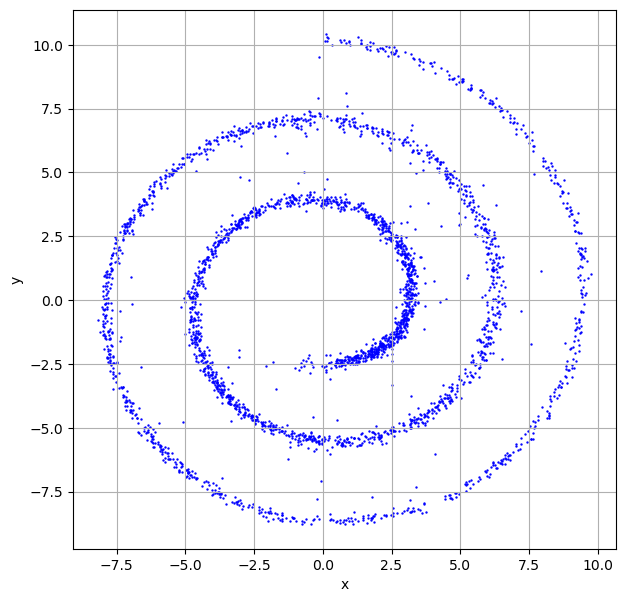

In [130]:
samples = sample()

plt.figure(figsize=(7, 7))
plt.scatter(samples[:, 0], samples[:, 1], s=0.5, c='blue')
plt.xlabel("x")
plt.ylabel("y")
plt.grid(True)
plt.show()

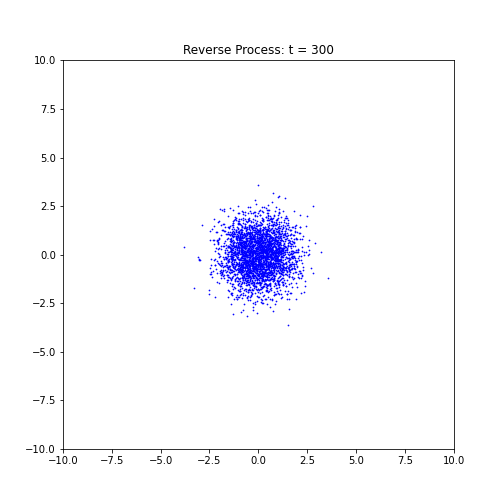

In [132]:
# takes around 50s to execute
history = sample_and_collect_history()

fig, ax = plt.subplots(figsize=(7, 7))
scat = ax.scatter([], [], s=0.5, c='blue')
ax.set_xlim(-10, 10)
ax.set_ylim(-10, 10)

def update(frame):
    scat.set_offsets(history[frame])
    current_t = T - frame
    ax.set_title(f"Reverse Process: t = {current_t}")
    return scat,

ani = animation.FuncAnimation(fig, update, frames=len(history), interval=30, blit=True, repeat=False)
plt.close()

if interactive_animation:
    display(HTML(ani.to_jshtml()))
else:
    ani.save('spiral_reverse.gif', writer='pillow', fps=10, dpi=72)
    display(Image(filename="spiral_reverse.gif", width=700, height=700))

The animation let's us very beautifully see how the model learns to step by step remove the noise from the data.

# Conclusion

In this notebook, we've built an intuition for Diffusion Models by grounding them in principles from statistical physics. The core analogy is powerful and direct:

* The Forward Process mirrors a physical diffusion, like a drop of ink spreading in water. It's a system evolving towards *maximum entropy*, where structured data ($x_0$) gradually degrades into pure noise ($x_T$).

* The Reverse Process is the generative model's primary task. It learns to reverse this diffusion by converting unstructured noise back into a complex data sample. This is achieved by training a neural network to predict the noise ($\epsilon$) added at each timestep.

From this foundational principle, a rich and rapidly evolving field of generative AI has emerged, producing state-of-the-art results in:

* Image Synthesis and Editing: Creating photorealistic images from text prompts.
* Audio Generation: Synthesizing realistic speech and complex music.
* Scientific Applications: Generating molecular structures for drug discovery and modeling complex physical systems.

Diffusion Models are a perfect example of the fundamental role of physics as a scientific discipline, and how a deep understanding of its principles can inspire and formalize breakthrough ideas in fields that might initially appear entirely unrelated.

# Appendix

Our loss is the negative log-likelihood of our training data:

$$
\mathcal{L} = - \sum_{\boldsymbol{x}_0 \in \mathcal{D}} \log p_\theta(\boldsymbol{x}_0)
= - \mathbb{E}_{\boldsymbol{x}_0 \sim q(\boldsymbol{x}_0)} \left[ \log p_\theta(\boldsymbol{x}_0) \right]
$$

Since the model includes latent variables $ \boldsymbol{x}_{1:T} $, marginalizing them out to compute $\log p_\theta(\boldsymbol{x}_0)$ directly is intractable.
We therefore employ variational inference and maximize a tractable evidence lower bound (ELBO), using the forward process $q(\boldsymbol{x}_{1:T} \mid \boldsymbol{x}_0)$ as our variational distribution:
$$
\log p_\theta(\boldsymbol{x}_0) \ge
\text{ELBO} = \mathbb{E}_{q(\boldsymbol{x}_{1:T} \mid \boldsymbol{x}_0)} \left[
\log \frac{p_\theta(\boldsymbol{x}_{0:T})}{q(\boldsymbol{x}_{1:T} \mid \boldsymbol{x}_0)}
\right].
$$

By substituting the equations for the forward and backward process and applying Bayes’ rule, we can rewrite this variational bound on the loss as a sum of three terms:
$$
\mathbb{E}_q\Bigl[
\underbrace{D_{\mathrm{KL}}\bigl(q(\boldsymbol{x}_T\mid \boldsymbol{x}_0)\,\|\,p(\boldsymbol{x}_T)\bigr)}_{L_T}
\;+\;\sum_{t>1}
\underbrace{D_{\mathrm{KL}}\bigl(q(\boldsymbol{x}_{t-1}\mid \boldsymbol{x}_t,\,\boldsymbol{x}_0)\,\|\,p_\theta(\boldsymbol{x}_{t-1}\mid \boldsymbol{x}_t)\bigr)}_{L_{t-1}}
\;-\;\underbrace{\log p_\theta(\boldsymbol{x}_0\mid \boldsymbol{x}_1)}_{L_0}
\Bigr],
$$
where $D_\mathrm{KL}$ denotes the Kullback-Leibler divergence.
While all three terms are necessary for likelihood-evaluation, in practice only the middle term $L_{t-1}$ is used during training. This term penalizes the discrepancy between the true posterior and the model’s reverse transition at each time step.

Importantly, most implementations choose not to learn the covariance $\boldsymbol{\Sigma}_\theta$ of the reverse distribution.
This design choice is motivated by both practical and theoretical considerations.
First, optimizing both the mean and variance simultaneously can make the loss surface difficult to navigate, as the KL divergence is highly sensitive to $\boldsymbol{\Sigma}_\theta$.
Additionally, to maintain a valid covariance matrix, $\boldsymbol{\Sigma}_\theta$ must remain symmetric and positive semi-definite, which constrains the optimization and can complicate gradient-based updates.

Moreover, in the true posterior $ q(\boldsymbol{x}_{t-1} \mid \boldsymbol{x}_t, \boldsymbol{x}_0) $, only the mean depends on $\boldsymbol{x}_0$ and $ t $, while the variance depends solely on the noise schedule:
$$
q(\boldsymbol{x}_{t-1}\mid \boldsymbol{x}_t,\boldsymbol{x}_0)
= \mathcal{N}\bigl(\boldsymbol{x}_{t-1};\,\boldsymbol{\tilde\mu}_t(\boldsymbol{x}_t,\boldsymbol{x}_0),\,\tilde\beta_t\,\boldsymbol{I}\bigr),
$$
$$
\boldsymbol{\tilde\mu}_t(\boldsymbol{x}_t,\boldsymbol{x}_0)
:= \frac{\sqrt{\bar\alpha_{t-1}}\;\beta_t}{1-\bar\alpha_t}\,\boldsymbol{x}_0
   + \frac{\sqrt{\alpha_t\,(1-\bar\alpha_{t-1})}}{1-\bar\alpha_t}\,\boldsymbol{x}_t,
\qquad
\tilde\beta_t
:= \frac{1-\bar\alpha_{t-1}}{1-\bar\alpha_t}\,\beta_t.
$$

For this reason, it is common in diffusion model implementations to fix the variance to a scaled identity matrix, setting $\sigma_t^2$ to either $\beta_t$ or $\tilde\beta_t$. With this simplification, the loss term for time step $t-1$ becomes:
$$
L_{t-1} = \mathbb{E}_q \left[
\frac{1}{2\sigma_t^2}
\left\| \boldsymbol{\tilde\mu}_t(\boldsymbol{x}_t, \boldsymbol{x}_0)
     - \boldsymbol{\mu}_\theta(\boldsymbol{x}_t, t) \right\|^2
\right] + \text{const}.
$$
This result shows that the reverse model is trained to approximate the posterior mean of the forward process at each time step.
This training objective was the one used in the foundational paper from 2015.
The key contribution from the authors of the breakthrough paper in 2020 was to simplify this formulation even further, leading to the widely used denoising loss.

## Denoising Loss Formulation

By inserting the equations for the posterior parameters and the direct sample into the mean-matching loss, and applying the Gaussian reparameterization trick for expectations, the loss can be rewritten in terms of the original data sample $ \boldsymbol{x}_0 $ and standard Gaussian noise $\boldsymbol{\epsilon}$:
$$
\mathbb{E}_{\boldsymbol{x}_0,\,\boldsymbol{\epsilon}} \left[
\frac{1}{2\sigma_t^2}
\left\|
\frac{1}{\sqrt{\alpha_t}} \left( \boldsymbol{x}_t - \frac{\beta_t}{\sqrt{1 - \bar\alpha_t}} \boldsymbol{\epsilon} \right)
- \boldsymbol{\mu}_\theta\big(\boldsymbol{x}_t, t\big)
\right\|^2
\right].
$$
Since the model also has $\boldsymbol{x}_t$ as an input, we can rewrite the mean-approximator $\boldsymbol{\mu}_\theta$ in a similar fashion.
Furthermore, it was empirically shown to improve sampling if we drop the scaling terms (dropping this down-weights the importance of earlier time steps $t$ to the loss).
This then results in the so-called simplified loss:
$$
\mathbb{E}_{\boldsymbol{x}_0,\,t,\,\boldsymbol{\epsilon}} \left[
\left\| \boldsymbol{\epsilon}
- \boldsymbol{\epsilon}_\theta\left(\boldsymbol{x}_t,\,t
\right) \right\|^2
\right]
$$
This formulation reveals that what we need to learn is the noise that was added at each step $t$ in the forward process.
This reparameterization let's us identify a direct connection to denoising score matching, where we also recover the noise which was added to a random variable in order to approximate the score of the underlying probability distribution.
This powerful connection was deeply explored further in the continuous-time setting by e.g. Song et al. (2021) in their work on *score-based generative modeling via stochastic differential equations*.